# <center>*Gap Option*</center>

A gap option is a type of financial derivative where the payoff depends on the difference between the price of the underlying asset and a predetermined strike price. Specifically, a gap call option pays out if the price of the underlying asset at maturity is above the strike price by more than a certain amount, called the "gap." Conversely, a gap put option pays out if the price of the underlying asset at maturity is below the strike price by more than the gap.

The formula for the payout of a gap call option is:

$$
\max(S_T - K_2, 0)
$$

where $S_T$ is the price of the underlying asset at maturity, and $K_2$ is the strike price plus the gap. If the difference between $S_T$ and $K_2$ is less than zero, the option expires worthless. 

The formula for the payout of a gap put option is:

$$
\max(K_2 - S_T, 0)
$$

where the variables have the same meaning as in the gap call option formula.

**Gap Option Pricing Formulae**

The pricing of gap options can be calculated using numerical methods, such as Monte Carlo simulations, or analytic methods, such as the Black-Scholes model with a modification to account for the gap. 

The formula for pricing a gap call option using the Black-Scholes model is:

$$
C_{gap} = S_0 N(d_1) - K_2 e^{-rT} N(d_2) 
$$

where $S_0$ is the current price of the underlying asset, $K_2$ is the strike price plus the gap, $r$ is the risk-free interest rate, $T$ is the time to maturity, $\sigma$ is the volatility of the underlying asset, $N(\cdot)$ is the cumulative distribution function of the standard normal distribution, $\phi(\cdot)$ is the probability density function of the standard normal distribution, and

$$
\begin{aligned}
d_1 &= \frac{\ln(S_0/K_2) + (r + \sigma^2/2)T}{\sigma\sqrt{T}} \\
d_2 &= d_1 - \sigma\sqrt{T}
\end{aligned}
$$

The formula for pricing a gap put option is similar, but with some changes to account for the put option payoff:

$$
P_{gap} = K_2 e^{-rT} N(-d_2) - S_0 N(-d_1) 
$$

where $P_{gap}$ is the price of the gap put option and the other variables have the same meanings as in the gap call option formula.

Note that the Black-Scholes model assumes that the underlying asset follows a log-normal distribution, which may not always hold in practice. Additionally, the model assumes that the risk-free interest rate and volatility are constant over the life of the option, which may not always be the case. As such, the pricing of gap options using the Black-Scholes model may have limitations and may not always accurately reflect market prices.I wil now prove this pricing formulae:-
$$ P = e^{-rT}(S_0e^{(b-r-\frac{1}{2}\sigma^2)T}N(d_1')-Ke^{-rT}N(d_1)-Ge^{-rT}N(d_2)) $$

To derive this formula, we first note that the gap option has a fixed payoff if the underlying asset price is above the strike price plus the gap level, and pays nothing if the underlying asset price is below the strike price. The payoff for a gap option can be represented as follows:

$$ Q = 
\begin{cases}
    S_T-K-G, & \text{if } S_T > K+G \\
    0, & \text{otherwise}
\end{cases} $$

where $Q$ is the payoff, $S_T$ is the price of the underlying asset at expiry, $K$ is the strike price, and $G$ is the gap level.

The price of a gap option can be calculated using the Black-Scholes model with an adjustment for the gap level. 

Using the risk-neutral valuation principle, we can assume that the expected payoff of the option is equal to its present value. Therefore, we can write:

$$ P = e^{-rT}E[Q] $$

To calculate $E[Q]$, we need to derive the distribution of $S_T$. Using the Black-Scholes model with an adjustment for the gap level, we can derive the following expressions for $d_1'$ and $d_2$:

$$ d_1' = \frac{\ln(S_0/(K+G))+(b+\frac{1}{2}\sigma^2)T}{\sigma\sqrt{T}} $$

and

$$ d_2 = d_1' - \sigma\sqrt{T} $$

Substituting these expressions into the equation for the expected payoff, we get:

$$ P = e^{-rT}E[Q] $$
$$ = e^{-rT}[(S_0-K-G)N(d_1')e^{-(b-r)T} - (S_0-K)e^{-rT}N(d_1) - G e^{-rT}N(d_2)] $$
$$ = e^{-rT}(S_0e^{(b-r-\frac{1}{2}\sigma^2)T}N(d_1')-Ke^{-rT}N(d_1)-Ge^{-rT}N(d_2)) $$

which is the formula for pricing a gap option with strike $K$ and gap level $G$. 

Below is the sensitivity analysis of Binary Option along with all the relevant plots:-


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 12}

matplotlib.rc('font', **font)
from scipy.stats import norm
import math

In [2]:
def gapOptionCall(t, T, sigma, r, St, K, Q):
    d1=(np.log(St/K)+(r+(sigma*sigma)/2)*(T-t))/(sigma*np.sqrt(T-t))
    d2=d1-sigma*np.sqrt(T-t)
    return St*norm.cdf(d1) - K*math.exp(-r*(T-t))*norm.cdf(d2)

def gapOptionPut(t, T, sigma, r, St, K, Q):
    d1=(np.log(St/K)+(r+(sigma*sigma)/2)*(T-t))/(sigma*np.sqrt(T-t))
    d2=d1-sigma*np.sqrt(T-t)
    return -St*norm.cdf(-d1) +K*math.exp(-r*(T-t))*norm.cdf(-d2)

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


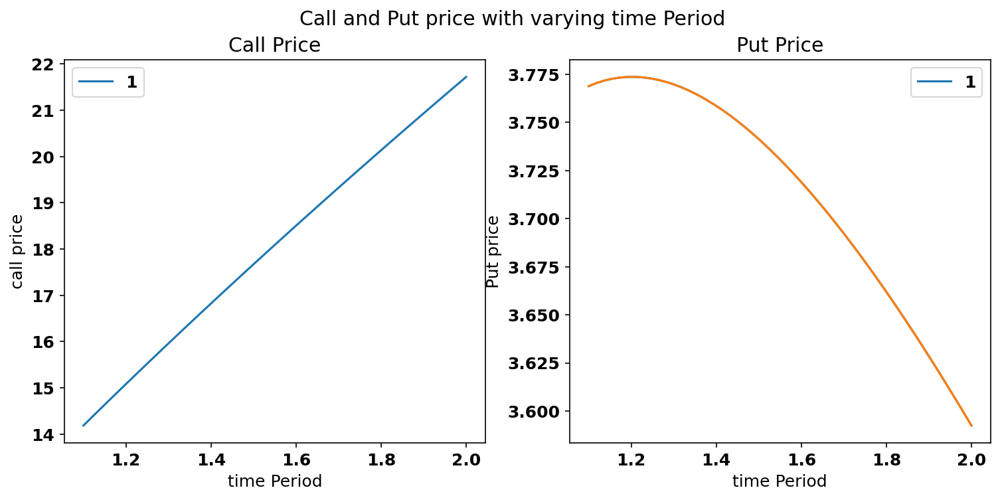

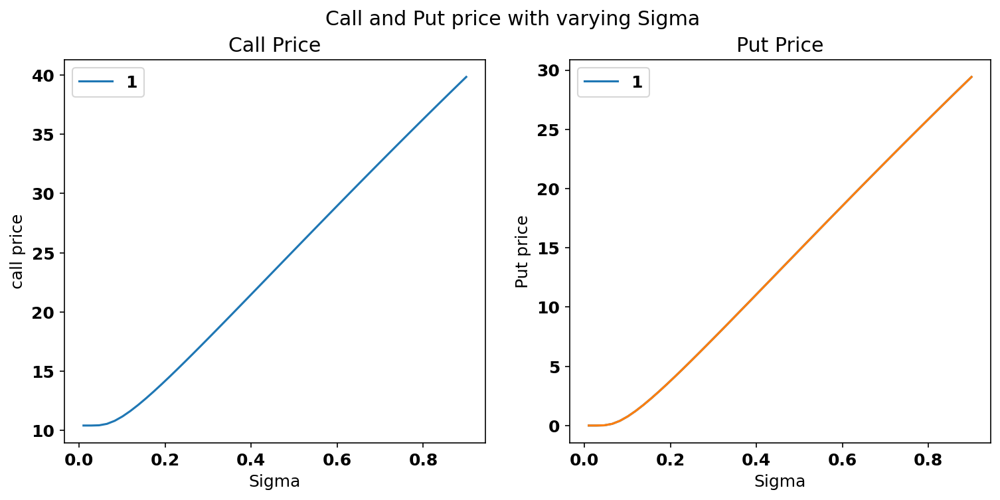

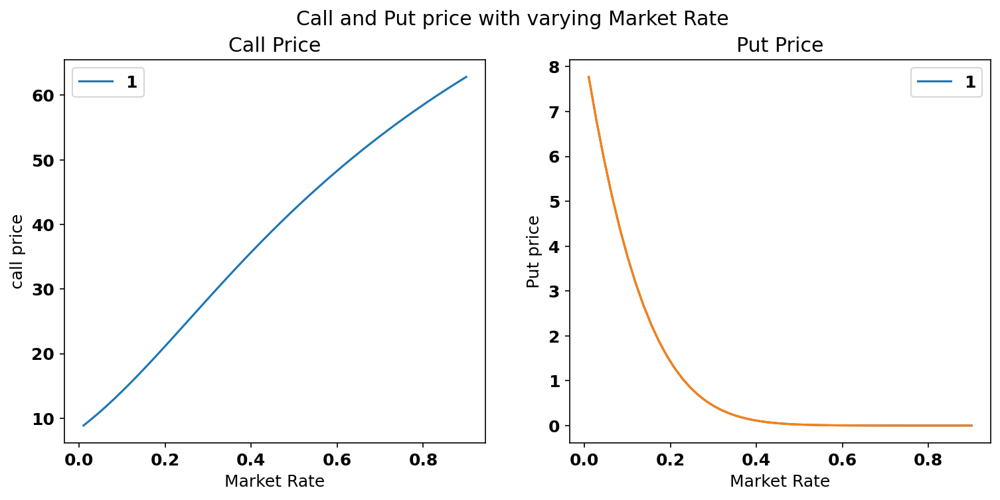

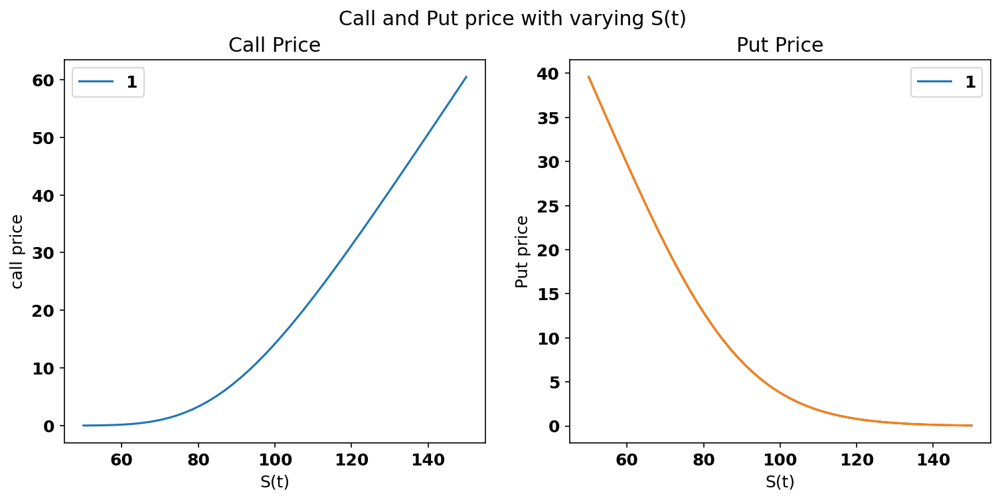

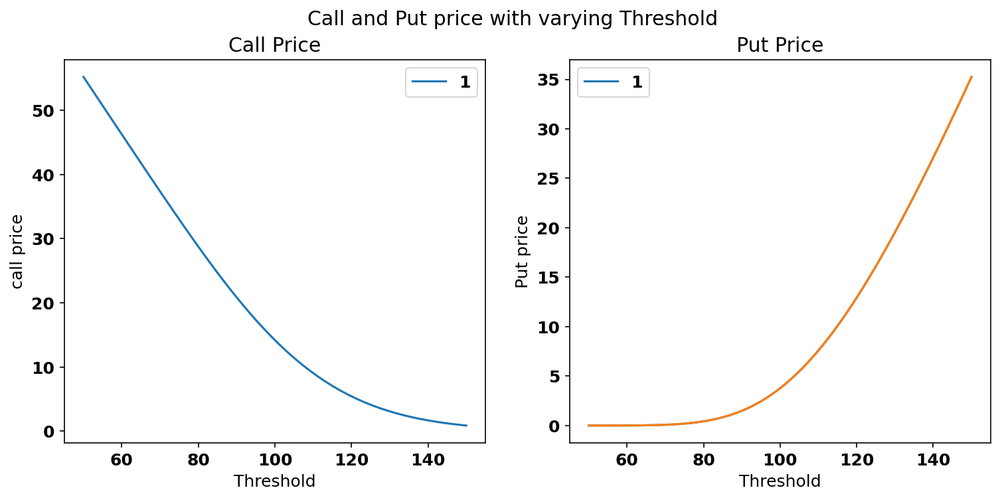

...

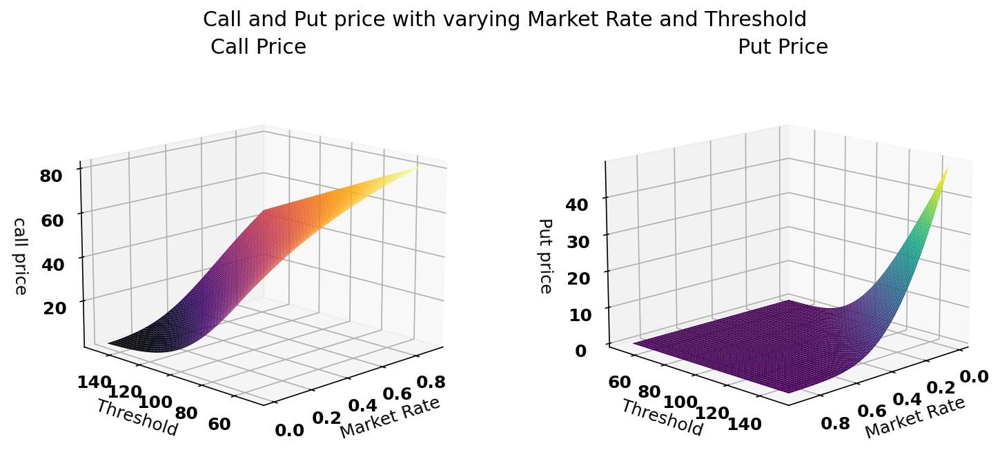

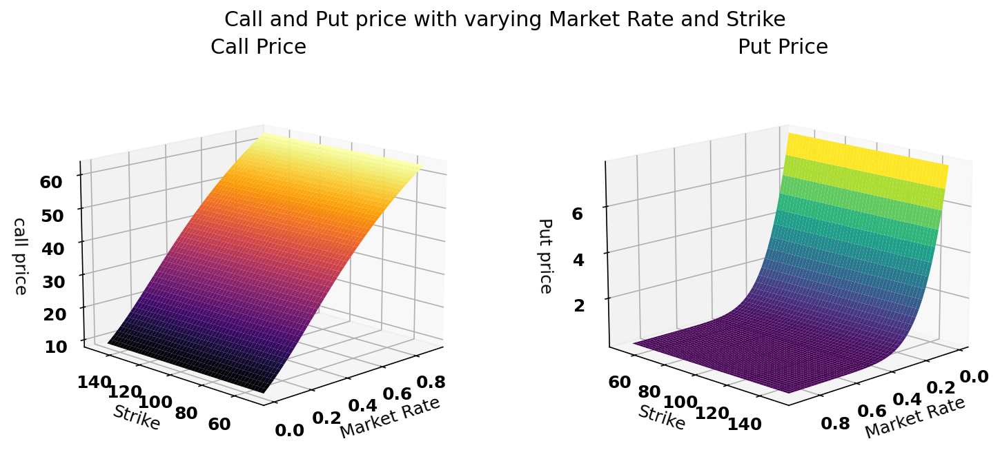

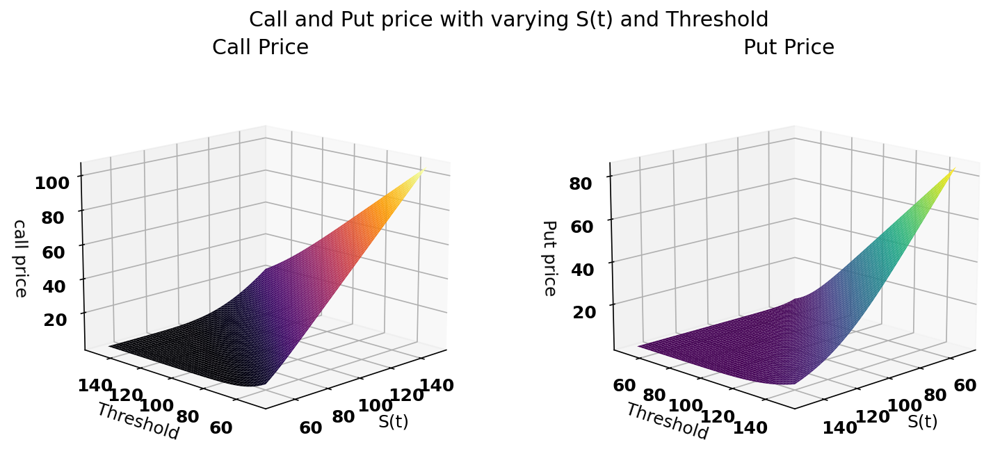

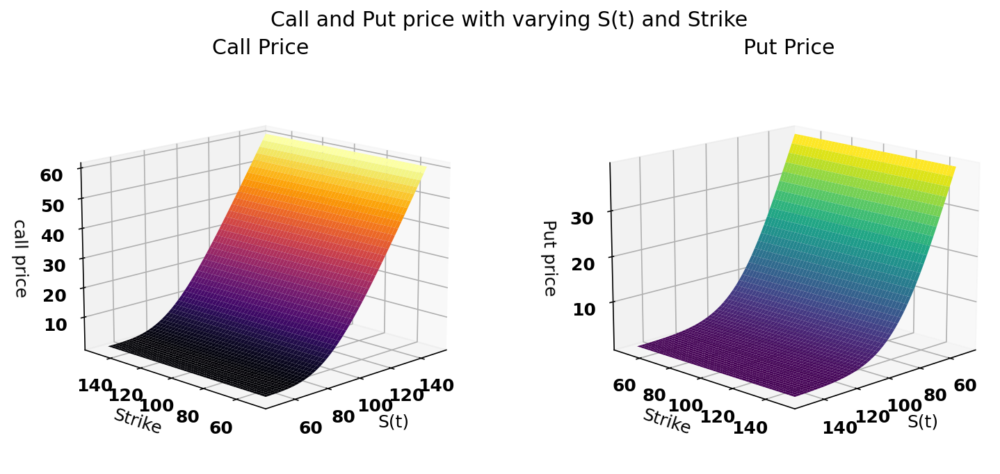

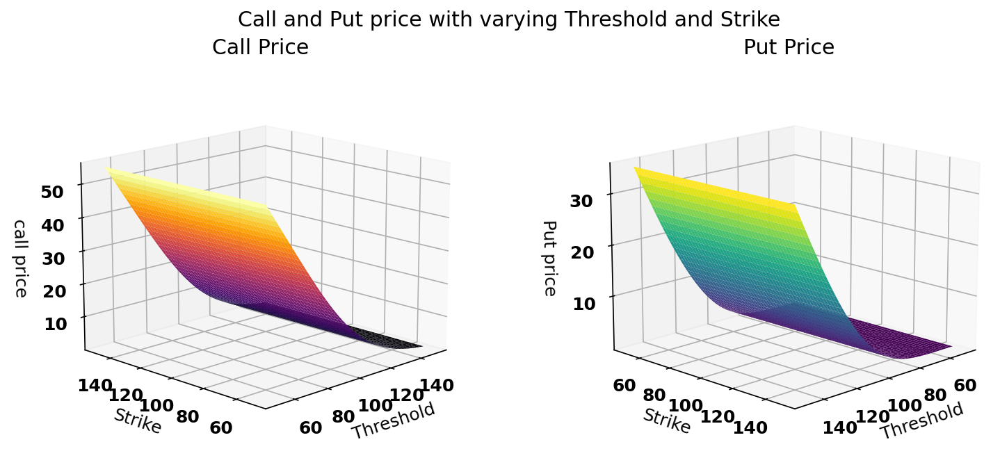

In [3]:
# def optionPrice(t, T, sigma, r, St, K, Q):
varying = []
varying.append(np.linspace(0,1,50))
varying.append(np.linspace(1.1,2,50))
varying.append(np.linspace(0.01,0.90,50))
varying.append(np.linspace(0.01,0.90,50))
varying.append(np.linspace(50,150,50))
varying.append(np.linspace(50,150,50))
varying.append(np.linspace(50,150,50))

names = ["start time", "time Period", "Sigma", "Market Rate", "S(t)", "Threshold", "Strike"]
for i in range(1,6):
    fig, ax = plt.subplots(nrows = 1,ncols = 2)
    for st in [1]:
        call_p = []
        put_p = []
        params = [0, 1.1, 0.2, 0.1, 100, 100, 100]
        for ii in range(len(varying[i])):
            params[i]=varying[i][ii]
            call_p.append(gapOptionCall(params[0],params[1],params[2],params[3],params[4],params[5],params[6]))
            put_p.append(gapOptionPut(params[0],params[1],params[2],params[3],params[4],params[5],params[6]))
            fig.suptitle("Call and Put price with varying "+names[i])
        ax[0].plot(varying[i],call_p)
        ax[1].plot(varying[i],put_p)
    fig.set_size_inches(12, 5)
    fig.set_dpi(150)
    ax[0].set_title("Call Price")
    ax[0].set_xlabel(names[i])
    ax[0].set_ylabel("call price")
    ax[1].plot(varying[i],put_p)
    ax[1].set_title("Put Price")
    ax[1].set_xlabel(names[i])
    ax[1].set_ylabel("Put price")
    ax[0].legend([1])
    ax[1].legend([1])
    plt.show()

for i in range(7):
    for j in range(i+1,7):
        fig, ax = plt.subplots(nrows = 1,ncols = 2,subplot_kw={"projection": "3d"})
        call_p = np.zeros((50,50))
        put_p = np.zeros((50,50))
        p_axis, q_axis = np.meshgrid(varying[i],varying[j])
        params = [0, 1.1, 0.2, 0.1, 100, 100, 100]
        for ii in range(len(p_axis)):
            for jj in range(len(q_axis)):
                params[i]=varying[i][ii]
                params[j]=varying[j][jj]
                call_p[ii][jj]=gapOptionCall(params[0],params[1],params[2],params[3],params[4],params[5],params[6])
                put_p[ii][jj]=gapOptionPut(params[0],params[1],params[2],params[3],params[4],params[5],params[6])
        call_p=call_p.T
        put_p=put_p.T
        fig.suptitle("Call and Put price with varying "+names[i]+" and "+names[j])
        fig.set_size_inches(12, 5)
        fig.set_dpi(150)
        ax[0].plot_surface(p_axis,q_axis,call_p,cmap='inferno')
        ax[0].set_title("Call Price")
        ax[0].set_xlabel(names[i])
        ax[0].set_ylabel(names[j])
        ax[0].set_zlabel("call price")
        ax[1].plot_surface(p_axis,q_axis,put_p,cmap='viridis')
        ax[1].set_title("Put Price")
        ax[1].set_xlabel(names[i])
        ax[1].set_ylabel(names[j])
        ax[1].set_zlabel("Put price")
        ax[0].view_init(15,-135)
        ax[1].view_init(15,45)
        plt.show()
    